In [1]:
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, RobustScaler

In [3]:
batch1 = pickle.load(open(r'/Users/johannesherstad/Master_Herstad-Gjerdingen/data/MIT_Stanford/raw/batch1.pkl', 'rb'))
#remove batteries that do not reach 80% capacity
del batch1['b1c8']
del batch1['b1c10']
del batch1['b1c12']
del batch1['b1c13']
del batch1['b1c22']

FileNotFoundError: [Errno 2] No such file or directory: '/Users/johannesherstad/Master_Herstad-Gjerdingen/data/MIT_Stanford/raw/batch1.pkl'

In [17]:
numBat1 = len(batch1.keys())
numBat1

41

In [18]:
batch2 = pickle.load(open(r'/Users/johannesherstad/Master_Herstad-Gjerdingen/data/MIT_Stanford/raw/batch2.pkl','rb'))

In [19]:
# There are four cells from batch1 that carried into batch2, we'll remove the data from batch2
# and put it with the correct cell from batch1
batch2_keys = ['b2c7', 'b2c8', 'b2c9', 'b2c15', 'b2c16']
batch1_keys = ['b1c0', 'b1c1', 'b1c2', 'b1c3', 'b1c4']
add_len = [662, 981, 1060, 208, 482];

In [20]:
for i, bk in enumerate(batch1_keys):
    batch1[bk]['cycle_life'] = batch1[bk]['cycle_life'] + add_len[i]
    for j in batch1[bk]['summary'].keys():
        if j == 'cycle':
            batch1[bk]['summary'][j] = np.hstack((batch1[bk]['summary'][j], batch2[batch2_keys[i]]['summary'][j] + len(batch1[bk]['summary'][j])))
        else:
            batch1[bk]['summary'][j] = np.hstack((batch1[bk]['summary'][j], batch2[batch2_keys[i]]['summary'][j]))
    last_cycle = len(batch1[bk]['cycles'].keys())
    for j, jk in enumerate(batch2[batch2_keys[i]]['cycles'].keys()):
        batch1[bk]['cycles'][str(last_cycle + j)] = batch2[batch2_keys[i]]['cycles'][jk]

In [21]:
del batch2['b2c7']
del batch2['b2c8']
del batch2['b2c9']
del batch2['b2c15']
del batch2['b2c16']

In [22]:
numBat2 = len(batch2.keys())
numBat2

43

In [23]:
batch3 = pickle.load(open(r'/Users/johannesherstad/Master_Herstad-Gjerdingen/data/MIT_Stanford/raw/batch3.pkl','rb'))
# remove noisy channels from batch3
del batch3['b3c37']
del batch3['b3c2']
del batch3['b3c23']
del batch3['b3c32']
del batch3['b3c42']
del batch3['b3c43']

In [24]:
numBat3 = len(batch3.keys())
numBat3

40

In [25]:
numBat = numBat1 + numBat2 + numBat3
numBat

124

In [26]:
bat_dict = {**batch1, **batch2, **batch3}

Text(0, 0.5, 'Discharge Capacity (Ah)')

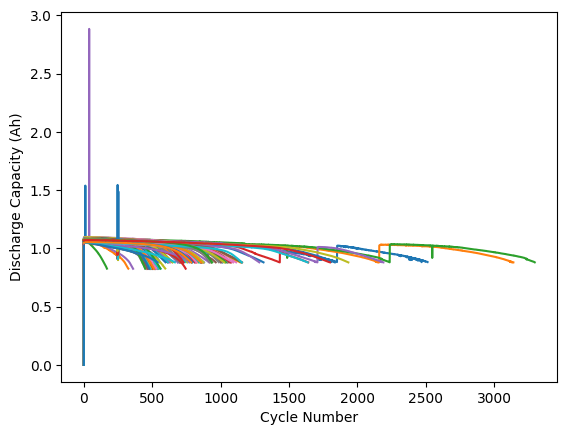

In [27]:
for i in bat_dict.keys():
    plt.plot(bat_dict[i]['summary']['cycle'], bat_dict[i]['summary']['QD'])
plt.xlabel('Cycle Number')
plt.ylabel('Discharge Capacity (Ah)')

In [ ]:

# Assuming bat_dict is already loaded
# Define fixed capacity limits
min_cap = 0.5  # Minimum allowed discharge capacity
max_cap = 1.2  # Maximum allowed discharge capacity

# Create the figure
fig = go.Figure()

# Get battery keys and determine the number for color sampling
cell_keys = list(bat_dict.keys())
num_cells = len(cell_keys)
colorscale = "Viridis"

# Loop through each battery in bat_dict, clean the data, and assign a Viridis color
for i, cell_key in enumerate(cell_keys):
    cycle_numbers = np.array(bat_dict[cell_key]['summary']['cycle'])
    discharge_capacity = np.array(bat_dict[cell_key]['summary']['QD'])

    # Replace out-of-bound values with NaN
    discharge_capacity[(discharge_capacity < min_cap) | (discharge_capacity > max_cap)] = np.nan

    # Interpolate to fill NaN values (forward and backward filling)
    discharge_capacity = pd.Series(discharge_capacity)\
                          .interpolate(method='linear', limit_direction='both')\
                          .fillna(method='bfill')\
                          .fillna(method='ffill').values

    # Sample a color from the Viridis colorscale based on the battery's index
    color = px.colors.sample_colorscale(
        colorscale, 
        i / (num_cells - 1) if num_cells > 1 else 0
    )[0]

    fig.add_trace(go.Scatter(
        x=cycle_numbers,
        y=discharge_capacity,
        mode='lines',  # Display both lines and markers
        showlegend=False,      # Hide legend for clarity
        line=dict(width=0.8, color=color), # Assign Viridis color to the line
        opacity=0.7
    ))

# Update the layout for clarity and thesis-quality appearance
fig.update_layout(
    font=dict(family="Times New Roman", size=18),  # Use Times New Roman, 18pt for body text
    title=dict(
        text="Stanford - Battery Capacity Over Cycles",
        x=0.5,
        xanchor="center",
        font=dict(size=24)  # Title font size of 20pt
    ),
    xaxis_title="Cycle Number",
    yaxis_title="Discharge Capacity (Ah)",
    template="plotly_white",  # Clean white background template
    width=1102,  # 14 cm at 200 DPI
    height=709,  # 9 cm at 200 DPI
    margin=dict(l=60, r=60, t=80, b=60),
)

# Save as PDF for thesis
fig.write_image("/Users/johannesherstad/Master_Herstad-Gjerdingen/reports/plotscapacity_degradation_stanford.pdf", engine="kaleido")

# Display the figure
fig.show()

/var/folders/nn/4_r89tj92wd44cypgj5z6vkh0000gn/T/ipykernel_11961/3677599048.py:29: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/var/folders/nn/4_r89tj92wd44cypgj5z6vkh0000gn/T/ipykernel_11961/3677599048.py:30: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



### Train and Test Split
If you are interested in using the same train/test split as the paper, use the indices specified below

In [16]:
test_ind = np.hstack((np.arange(0,(numBat1+numBat2),2),83))
train_ind = np.arange(1,(numBat1+numBat2-1),2)
secondary_test_ind = np.arange(numBat-numBat3,numBat);

In [ ]:
fig = go.Figure()

# Loop through each battery in bat_dict
for cell_key in bat_dict.keys():
    cycle_numbers = bat_dict[cell_key]['summary']['cycle']
    discharge_capacity = bat_dict[cell_key]['summary']['QD']
    
    fig.add_trace(go.Scatter(
        x=cycle_numbers,
        y=discharge_capacity,
        mode='lines+markers',
        name=cell_key
    ))

# Update plot layout for clarity
fig.update_layout(
    title='Discharge Capacity Fade Curves for All Batteries',
    xaxis_title='Cycle Number',
    yaxis_title='Discharge Capacity (Ah)',
    legend_title='Battery Cells',
    template='plotly_white'
)

fig.show()


In [ ]:


# Lists for storing ratios
capacity_ratios = []

# Loop through all battery cells
for cell_key in bat_dict.keys():
    discharge_capacity = bat_dict[cell_key]['summary']['QD']
    ratio = discharge_capacity[-1] / discharge_capacity[0]  # last / first capacity
    capacity_ratios.append(ratio)

# Plot the distribution of capacity ratios
fig = go.Figure(data=[go.Histogram(
    x=capacity_ratios,
    nbinsx=20,
    marker=dict(color='mediumseagreen', line=dict(color='black', width=1))
)])

# Update layout for better readability
fig.update_layout(
    title='Distribution of Final/Initial Discharge Capacity Ratios',
    xaxis_title='Final Capacity / Initial Capacity',
    yaxis_title='Number of Battery Cells',
    template='plotly_white'
)

fig.show()


/var/folders/nn/4_r89tj92wd44cypgj5z6vkh0000gn/T/ipykernel_29435/2919684056.py:9: RuntimeWarning:

divide by zero encountered in scalar divide



/var/folders/nn/4_r89tj92wd44cypgj5z6vkh0000gn/T/ipykernel_29435/2636629227.py:20: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



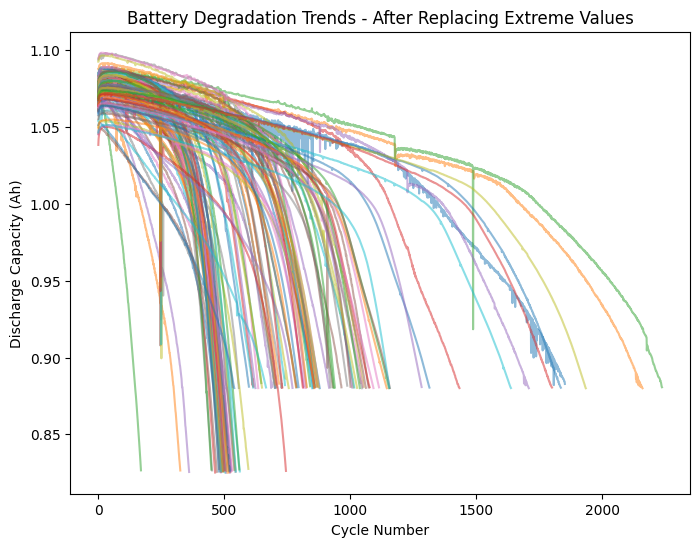

In [ ]:
# Step 1: Define fixed capacity limits
min_cap = 0.5  # Minimum allowed discharge capacity
max_cap = 1.2  # Maximum allowed discharge capacity

# Step 2: Replace extreme values with NaN and fill missing values
cleaned_bat_dict = {}

for cell_key in bat_dict.keys():
    cycles = np.array(bat_dict[cell_key]['summary']['cycle'])
    capacities = np.array(bat_dict[cell_key]['summary']['QD'])

    # Replace out-of-bound values with NaN
    capacities[(capacities < min_cap) | (capacities > max_cap)] = np.nan

    # Convert to pandas Series for interpolation
    capacities = pd.Series(capacities).interpolate(method='linear', limit_direction='both').fillna(method='bfill').fillna(method='ffill')

    # Store the cleaned data
    cleaned_bat_dict[cell_key] = {'cycle': cycles, 'QD': capacities.values}

# Step 3: Plot the cleaned data
plt.figure(figsize=(8, 6))

for cell_key in cleaned_bat_dict.keys():
    plt.plot(cleaned_bat_dict[cell_key]['cycle'], cleaned_bat_dict[cell_key]['QD'], alpha=0.5)

plt.xlabel('Cycle Number')
plt.ylabel('Discharge Capacity (Ah)')
plt.title("Battery Degradation Trends - After Replacing Extreme Values")
plt.show()


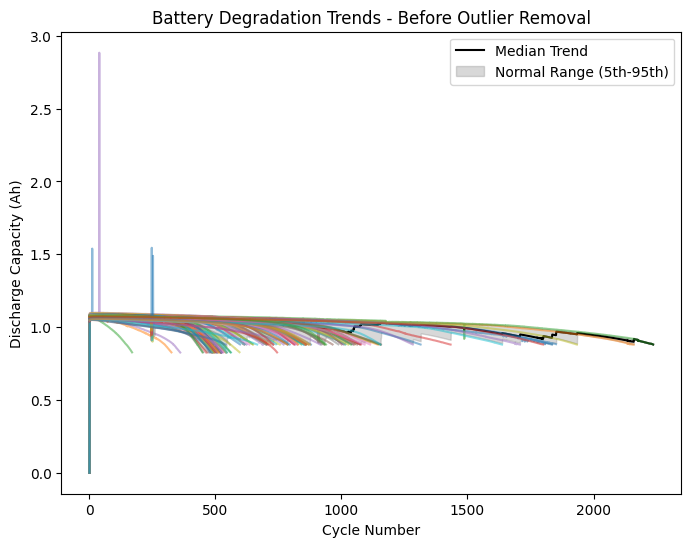

In [49]:
import matplotlib.pyplot as plt

# Compute median and percentiles per cycle
df = pd.DataFrame({'Cycle': all_cycles, 'Capacity': all_capacities})
df_grouped = df.groupby('Cycle')['Capacity']
median_trend = df_grouped.median()
lower_band = df_grouped.quantile(0.05)
upper_band = df_grouped.quantile(0.95)

# Plot
plt.figure(figsize=(8,6))
plt.plot(median_trend.index, median_trend, color='black', label='Median Trend')
plt.fill_between(median_trend.index, lower_band, upper_band, color='gray', alpha=0.3, label='Normal Range (5th-95th)')

# Plot individual battery curves (before filtering)
for cell_key in bat_dict.keys():
    plt.plot(bat_dict[cell_key]['summary']['cycle'], bat_dict[cell_key]['summary']['QD'], alpha=0.5)

plt.xlabel('Cycle Number')
plt.ylabel('Discharge Capacity (Ah)')
plt.legend()
plt.title("Battery Degradation Trends - Before Outlier Removal")
plt.show()


/var/folders/nn/4_r89tj92wd44cypgj5z6vkh0000gn/T/ipykernel_29435/1917902639.py:23: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



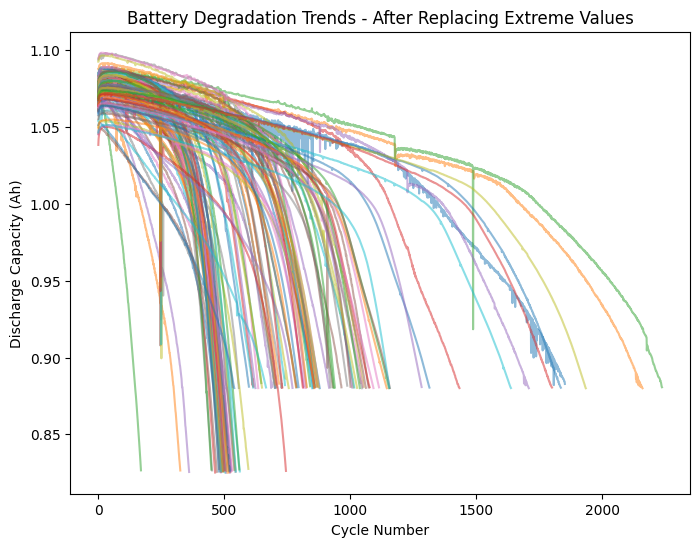

In [ ]:


# Step 1: Prepare cleaned data for plotting
cleaned_cycles = []
cleaned_capacities = []

for cell_key in bat_dict.keys():
    cycles = np.array(bat_dict[cell_key]['summary']['cycle'])
    capacities = clean_outliers_fixed_limits(np.array(bat_dict[cell_key]['summary']['QD']), min_cap, max_cap)  # Apply cleaning

    cleaned_cycles.append(cycles)
    cleaned_capacities.append(capacities)

# Step 2: Plot the cleaned battery degradation curves
plt.figure(figsize=(8, 6))

for i in range(len(cleaned_cycles)):
    plt.plot(cleaned_cycles[i], cleaned_capacities[i], alpha=0.5)

plt.xlabel('Cycle Number')
plt.ylabel('Discharge Capacity (Ah)')
plt.title("Battery Degradation Trends - After Replacing Extreme Values")
plt.show()


/var/folders/nn/4_r89tj92wd44cypgj5z6vkh0000gn/T/ipykernel_29435/1917902639.py:23: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



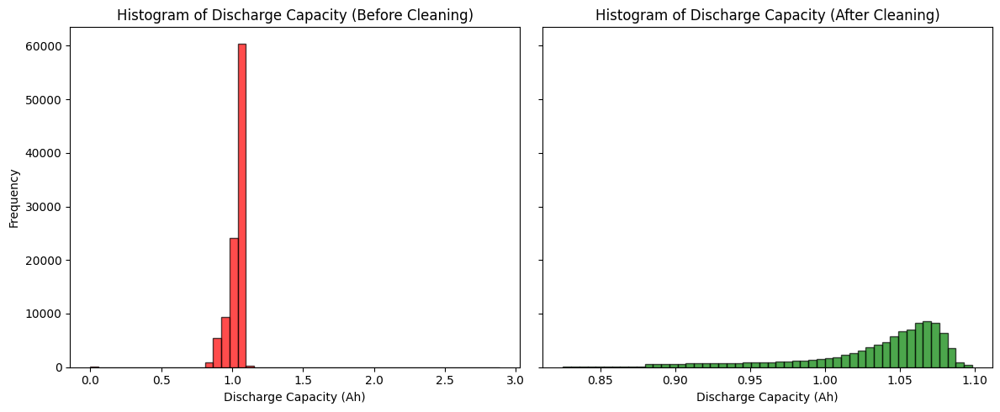

In [ ]:


# Step 1: Collect all capacity values before cleaning
raw_capacities = []

for cell_key in bat_dict.keys():
    raw_capacities.extend(bat_dict[cell_key]['summary']['QD'])

# Step 2: Collect all capacity values after cleaning
cleaned_capacities = []

for cell_key in bat_dict.keys():
    cleaned_values = clean_outliers_fixed_limits(np.array(bat_dict[cell_key]['summary']['QD']), min_cap, max_cap)
    cleaned_capacities.extend(cleaned_values)

# Step 3: Plot histograms before and after cleaning
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Histogram before cleaning
axes[0].hist(raw_capacities, bins=50, alpha=0.7, color='red', edgecolor='black')
axes[0].set_title("Histogram of Discharge Capacity (Before Cleaning)")
axes[0].set_xlabel("Discharge Capacity (Ah)")
axes[0].set_ylabel("Frequency")

# Histogram after cleaning
axes[1].hist(cleaned_capacities, bins=50, alpha=0.7, color='green', edgecolor='black')
axes[1].set_title("Histogram of Discharge Capacity (After Cleaning)")
axes[1].set_xlabel("Discharge Capacity (Ah)")

# Show the plots
plt.tight_layout()
plt.show()


In [ ]:


# Parameters
max_cycles = 120  # Maximum cycles in each expanding window
threshold_fraction = 0.8  # Capacity threshold for RUL calculation
step_size = 5  # Step size for expanding window sampling
min_cap = 0.5  # Minimum allowed discharge capacity
max_cap = 1.2  # Maximum allowed discharge capacity

def clean_outliers_fixed_limits(seq, min_cap=0.5, max_cap=1.2):
    """
    Replaces extreme capacity values with NaN and imputes missing values.
    """
    seq = np.array(seq).squeeze()
    
    # Replace values outside limits with NaN
    seq[(seq < min_cap) | (seq > max_cap)] = np.nan

    # Impute missing values using linear interpolation + forward/backward fill
    seq = pd.Series(seq).interpolate(method='linear', limit_direction='both').fillna(method='bfill').fillna(method='ffill').values
    return seq

# Step 1: Generate expanding windows and corresponding RUL
exp_windows, exp_ruls, exp_cell_ids = [], [], []

for cell_key in bat_dict.keys():
    cycles = np.array(bat_dict[cell_key]['summary']['cycle'])
    capacities = np.array(bat_dict[cell_key]['summary']['QD'])

    # Apply fixed-limit outlier removal and imputation
    capacities = clean_outliers_fixed_limits(capacities, min_cap, max_cap)

    # Determine EOL
    initial_capacity = capacities[0]
    threshold = threshold_fraction * initial_capacity
    eol_cycle = cycles[np.argmax(capacities < threshold)] if np.any(capacities < threshold) else cycles[-1]

    # Expanding window sampling
    for end_idx in range(step_size, len(cycles), step_size):
        window_cycles = cycles[:end_idx+1]
        window_caps = capacities[:end_idx+1]

        # Keep only last max_cycles (truncate front)
        if len(window_caps) > max_cycles:
            window_caps = window_caps[-max_cycles:]
            window_cycles = window_cycles[-max_cycles:]

        rul = eol_cycle - window_cycles[-1]
        if rul < 0:
            continue  # Exclude sequences beyond EOL

        exp_windows.append(window_caps)
        exp_ruls.append(rul)
        exp_cell_ids.append(cell_key)

# Convert to numpy arrays
X_expanding = np.array([np.pad(seq, (max_cycles - len(seq), 0), 'edge') for seq in exp_windows])
y_expanding = np.array(exp_ruls)

# Step 2: Apply Robust Normalization to input features
scaler_X = RobustScaler()
X_exp_norm = scaler_X.fit_transform(X_expanding.reshape(-1, 1)).reshape(X_expanding.shape[0], max_cycles, 1)

# Step 3: Split by battery cells (train/test split)
unique_cells = np.unique(exp_cell_ids)
train_cells, test_cells = train_test_split(unique_cells, test_size=0.2, random_state=42)

train_idx = [i for i, cell in enumerate(exp_cell_ids) if cell in train_cells]
test_idx = [i for i, cell in enumerate(exp_cell_ids) if cell in test_cells]

X_train, y_train = X_exp_norm[train_idx], y_expanding[train_idx]
X_test, y_test = X_exp_norm[test_idx], y_expanding[test_idx]

# Step 4: Apply MinMax Scaling to RUL values
scaler_y = MinMaxScaler(feature_range=(0, 1))
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

# Print dataset shapes
print(f"Train shape: {X_train.shape}, {y_train_scaled.shape}")
print(f"Test shape: {X_test.shape}, {y_test_scaled.shape}")

# Verify MinMax scaling worked correctly
print(f"Max RUL in Training Data (Original Scale): {np.max(y_train):.2f}")
print(f"Max RUL in Test Data (Original Scale): {np.max(y_test):.2f}")
print(f"Max RUL in Training Data (Scaled): {np.max(y_train_scaled):.2f}")
print(f"Max RUL in Test Data (Scaled): {np.max(y_test_scaled):.2f}")


/var/folders/nn/4_r89tj92wd44cypgj5z6vkh0000gn/T/ipykernel_29435/3623673472.py:23: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Train shape: (15853, 120, 1), (15853,)
Test shape: (4053, 120, 1), (4053,)
Max RUL in Training Data (Original Scale): 2230.00
Max RUL in Test Data (Original Scale): 1845.00
Max RUL in Training Data (Scaled): 1.00
Max RUL in Test Data (Scaled): 0.83


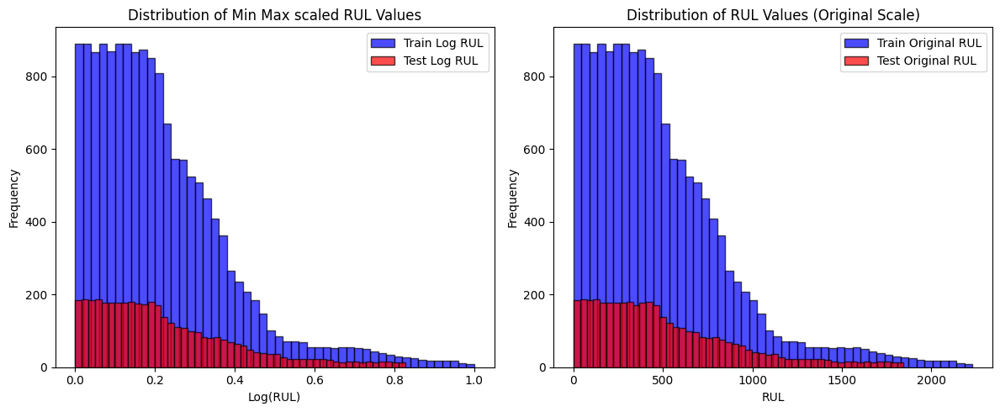

In [ ]:

# Step 1: Check the distribution of log-transformed RUL values
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(y_train_scaled, bins=50, alpha=0.7, color='blue', edgecolor='black', label="Train Log RUL")
plt.hist(y_test_scaled, bins=50, alpha=0.7, color='red', edgecolor='black', label="Test Log RUL")
plt.xlabel("Log(RUL)")
plt.ylabel("Frequency")
plt.title("Distribution of Min Max scaled RUL Values")
plt.legend()

# Step 2: Check the original scale after applying expm1
plt.subplot(1, 2, 2)
plt.hist(y_train, bins=50, alpha=0.7, color='blue', edgecolor='black', label="Train Original RUL")
plt.hist(y_test, bins=50, alpha=0.7, color='red', edgecolor='black', label="Test Original RUL")
plt.xlabel("RUL")
plt.ylabel("Frequency")
plt.title("Distribution of RUL Values (Original Scale)")
plt.legend()

plt.tight_layout()
plt.show()




X_test shape: (4053, 120, 1)


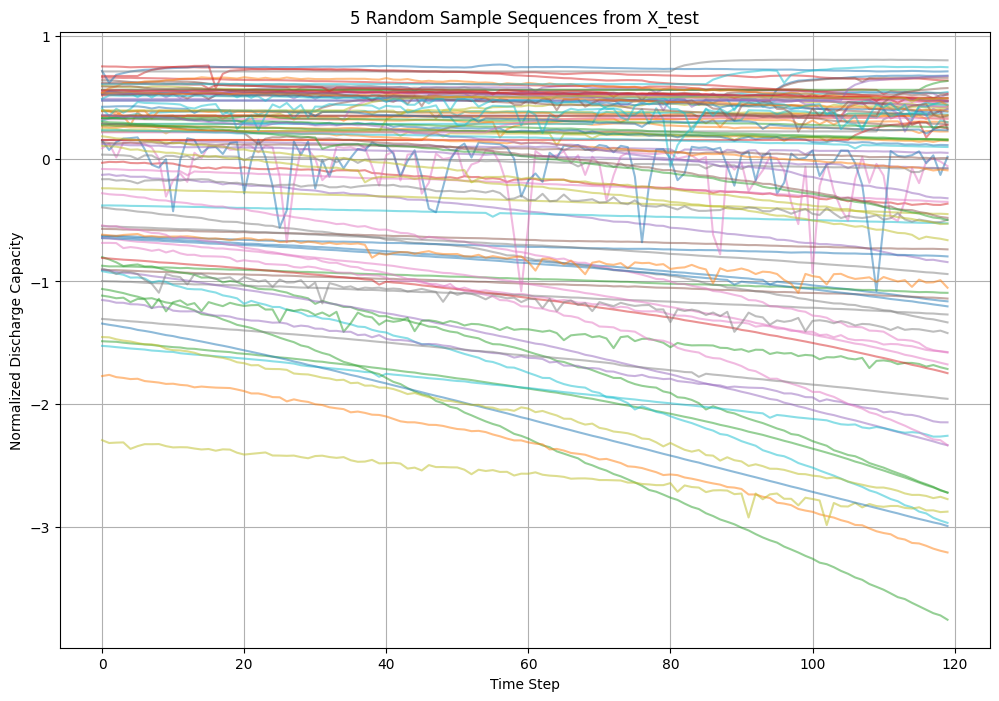

In [90]:
import matplotlib.pyplot as plt
import numpy as np

# Ensure X_test is available
print("X_test shape:", X_test.shape)  # Should be (N, 120, 1)

# Select 100 random sequences
num_sequences = min(100, len(X_test))  # Ensure it doesn't exceed dataset size
random_indices = np.random.choice(len(X_test), num_sequences, replace=False)

plt.figure(figsize=(12, 8))

for i in random_indices:
    sequence = X_test[i].squeeze()  # Ensure correct shape
    plt.plot(sequence, alpha=0.5)  # Use transparency for better visibility

plt.title('5 Random Sample Sequences from X_test')
plt.xlabel('Time Step')
plt.ylabel('Normalized Discharge Capacity')
plt.grid(True)
plt.show()


In [58]:
# Check for missing values
print("Missing values in X_train:", np.isnan(X_train).sum())
print("Missing values in y_train:", np.isnan(y_train_log).sum())
print("Missing values in X_test:", np.isnan(X_test).sum())
print("Missing values in y_test:", np.isnan(y_test_log).sum())


Missing values in X_train: 0
Missing values in y_train: 0
Missing values in X_test: 0
Missing values in y_test: 0


In [81]:
import plotly.graph_objects as go

# Combine train and test targets if desired
y_combined = np.concatenate([y_train, y_test])

fig = go.Figure(data=[go.Histogram(
    x=y_combined,
    nbinsx=30,
    marker=dict(color='lightblue', line=dict(color='black', width=1))
)])

fig.update_layout(
    title='Distribution of Target RUL Data (y)',
    xaxis_title='RUL',
    yaxis_title='Frequency',
    template='plotly_white'
)

fig.show()


In [82]:
import plotly.graph_objects as go

# Combine train and test targets if desired
y_combined = y_train

fig = go.Figure(data=[go.Histogram(
    x=y_combined,
    nbinsx=30,
    marker=dict(color='lightblue', line=dict(color='black', width=1))
)])

fig.update_layout(
    title='Distribution of Target RUL Data (y)',
    xaxis_title='RUL',
    yaxis_title='Frequency',
    template='plotly_white'
)

fig.show()


In [83]:
import plotly.graph_objects as go

# Combine train and test targets if desired
y_combined = y_test

fig = go.Figure(data=[go.Histogram(
    x=y_combined,
    nbinsx=30,
    marker=dict(color='lightblue', line=dict(color='black', width=1))
)])

fig.update_layout(
    title='Distribution of Target RUL Data (y)',
    xaxis_title='RUL',
    yaxis_title='Frequency',
    template='plotly_white'
)

fig.show()


In [84]:
import plotly.graph_objects as go
import numpy as np

# Assuming y_train and y_test are in original scale, first apply log transform
y_train_log = np.log1p(y_train)  # log1p avoids log(0) issues
y_test_log = np.log1p(y_test)

# Combine train and test targets
y_combined_log = np.concatenate([y_train_log, y_test_log])

# Plot histogram of log-transformed RUL
fig = go.Figure(data=[go.Histogram(
    x=y_combined_log,
    nbinsx=30,
    marker=dict(color='lightblue', line=dict(color='black', width=1))
)])

fig.update_layout(
    title='Distribution of Log-Scaled Target RUL Data',
    xaxis_title='Log-Scaled RUL',
    yaxis_title='Frequency',
    template='plotly_white'
)

fig.show()


In [61]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score

# Flatten sequences for regression model (required for Lasso)
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Fit Lasso model
lasso_model = Lasso(alpha=0.001)
lasso_model.fit(X_train_flat, y_train_log)  # Using log-transformed y_train

# Predict in log scale
y_pred_lasso_log = lasso_model.predict(X_test_flat)

# Transform predictions and ground truth back to original scale
y_pred_lasso = np.expm1(y_pred_lasso_log)  # Inverse of log1p
y_test_original = np.expm1(y_test_log)

# Evaluate performance in original scale
rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_lasso))
r2 = r2_score(y_test_original, y_pred_lasso)

print(f"RMSE: {rmse:.4f}, R²: {r2:.4f}")


RMSE: 313.2739, R²: 0.3896


/Users/johannesherstad/miniconda3/envs/D2D_env/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.523e+01, tolerance: 1.823e+00



In [62]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Flatten sequences for regression model
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Fit Decision Tree model
dt_model = DecisionTreeRegressor(max_depth=5, random_state=42)  # Adjust max_depth as needed
dt_model.fit(X_train_flat, y_train_log)  # Using log-transformed y_train

# Predict in log scale
y_pred_dt_log = dt_model.predict(X_test_flat)

# Transform predictions and ground truth back to original scale
y_pred_dt = np.expm1(y_pred_dt_log)  # Inverse of log1p
y_test_original = np.expm1(y_test_log)

# Compute RMSE (Root Mean Squared Error) instead of MSE
rmse_dt = np.sqrt(mean_squared_error(y_test_original, y_pred_dt))
r2_dt = r2_score(y_test_original, y_pred_dt)

print(f"Decision Tree RMSE: {rmse_dt:.4f}, R²: {r2_dt:.4f}")


Decision Tree RMSE: 301.1062, R²: 0.4361


In [63]:
class Config:
    lstm_units = 128  # Increased units
    lstm_dense_units = 64  # Increased dense layer size
    lstm_dropout_rate = 0.3  # Increased dropout
    learning_rate = 0.0003  # Lower LR for better convergence
    clipnorm = 1.0
    patience = 15  # Increased patience for early stopping
    eol_capacity = 0.8

import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import datetime
import os

def train_lstm_model(config, X_train, y_train, X_val, y_val):
    input_shape = (X_train.shape[1], X_train.shape[2])
    print(f"Input shape: {input_shape}")

    inputs = Input(shape=input_shape)

    # Stacked LSTM layers
    x = LSTM(config.lstm_units, return_sequences=True, activation='tanh', recurrent_activation='sigmoid', name="lstm_1")(inputs)
    x = Dropout(config.lstm_dropout_rate)(x)
    x = LSTM(config.lstm_units // 2, return_sequences=False, activation='tanh', recurrent_activation='sigmoid', name="lstm_2")(x)
    
    # Dense layers
    x = Dense(config.lstm_dense_units * 2, activation='tanh')(x)
    x = Dropout(config.lstm_dropout_rate)(x)
    x = Dense(config.lstm_dense_units, activation='tanh')(x)
    
    outputs = Dense(1)(x)

    model = Model(inputs=inputs, outputs=outputs)

    optimizer = Adam(learning_rate=config.learning_rate, weight_decay=1e-5)
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

    # Callbacks
    timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=config.patience, restore_best_weights=True),
        ModelCheckpoint(
            os.path.join("experiments", "models", f"lstm_regression_{timestamp}_best.keras"),
            monitor='val_loss',
            save_best_only=True,
            verbose=1
        )
    ]

    history = model.fit(
        X_train, y_train, epochs=150, batch_size=64,  # Increased epochs & batch size
        validation_data=(X_val, y_val), callbacks=callbacks
    )

    return model, history.history

# Example usage:
config = Config()
X_train_final, X_val, y_train_final, y_val = train_test_split(X_train, y_train_log, test_size=0.2, random_state=42)

model, history = train_lstm_model(config, X_train_final, y_train_final, X_val, y_val)

# Evaluate on test set:
y_pred_log = model.predict(X_test).flatten()
y_pred = np.expm1(y_pred_log)  # Transform back from log
y_test_original = np.expm1(y_test_log)

# Compute RMSE
rmse_lstm = np.sqrt(mean_squared_error(y_test_original, y_pred))
r2_lstm = r2_score(y_test_original, y_pred)

print(f"LSTM Test RMSE: {rmse_lstm:.4f}, R²: {r2_lstm:.4f}")


Input shape: (120, 1)
Epoch 1/150
199/199 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 13.4965 - mae: 2.6497
Epoch 1: val_loss improved from inf to 0.32670, saving model to experiments/models/lstm_regression_20250319_085427_best.keras
199/199 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 13.4534 - mae: 2.6428 - val_loss: 0.3267 - val_mae: 0.4654
Epoch 2/150
199/199 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.3499 - mae: 0.4744
Epoch 2: val_loss did not improve from 0.32670
199/199 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.3498 - mae: 0.4744 - val_loss: 0.3417 - val_mae: 0.4775
Epoch 3/150
199/199 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.3272 - mae: 0.4600
Epoch 3: val_loss improved from 0.32670 to 0.27718, saving model to experiments/models/lstm_regression_20250319_085427_best.keras
199/199 ━━━━━━━━━━━━━━━━━━━━ 34s 172ms/step - loss: 0.3272 - mae: 0.4599 - val_loss: 0.2772 - val_mae: 0.4262
Epoch 4/150
199/199 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.2986 - mae: 0.4424
Epoch 4

In [65]:
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

# Evaluate on test set:
y_pred_log = model.predict(X_test).flatten()

# Transform predictions and ground truth back to original scale
y_pred_lstm = np.expm1(y_pred_log)  # Inverse of log1p
y_test_original = np.expm1(y_test_log)

# Compute RMSE (Root Mean Squared Error) instead of MSE
rmse_lstm = np.sqrt(mean_squared_error(y_test_original, y_pred_lstm))
r2_lstm = r2_score(y_test_original, y_pred_lstm)

print(f"LSTM Test RMSE: {rmse_lstm:.4f}, R²: {r2_lstm:.4f}")

127/127 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step
LSTM Test RMSE: 243.6798, R²: 0.6307


In [66]:
import plotly.graph_objects as go
import numpy as np

# Ensure all predictions and ground truth values are transformed back from log scale
y_test_original = np.expm1(y_test_log)  # Transform back
y_pred_lstm_original = np.expm1(y_pred_log)

# Create the interactive plot
fig = go.Figure()

# Lasso predictions
fig.add_trace(go.Scatter(
    x=y_test_original, y=y_pred_lasso, mode='markers',
    name='Lasso', marker=dict(color='blue', opacity=0.7)
))

# Decision Tree predictions
fig.add_trace(go.Scatter(
    x=y_test_original, y=y_pred_dt, mode='markers',
    name='Decision Tree', marker=dict(color='green', opacity=0.7)
))

# LSTM predictions
fig.add_trace(go.Scatter(
    x=y_test_original, y=y_pred_lstm_original, mode='markers',
    name='LSTM', marker=dict(color='red', opacity=0.7)
))

# Ideal reference line (perfect predictions)
fig.add_trace(go.Scatter(
    x=[y_test_original.min(), y_test_original.max()],
    y=[y_test_original.min(), y_test_original.max()],
    mode='lines',
    name='Ideal (y = x)',
    line=dict(color='black', dash='dash')
))

# Update layout
fig.update_layout(
    title='True vs Predicted RUL values for All Models',
    xaxis_title='True RUL',
    yaxis_title='Predicted RUL',
    template='plotly_white',
    legend=dict(y=0.99, x=0.01),
    width=800,
    height=600
)

fig.show()


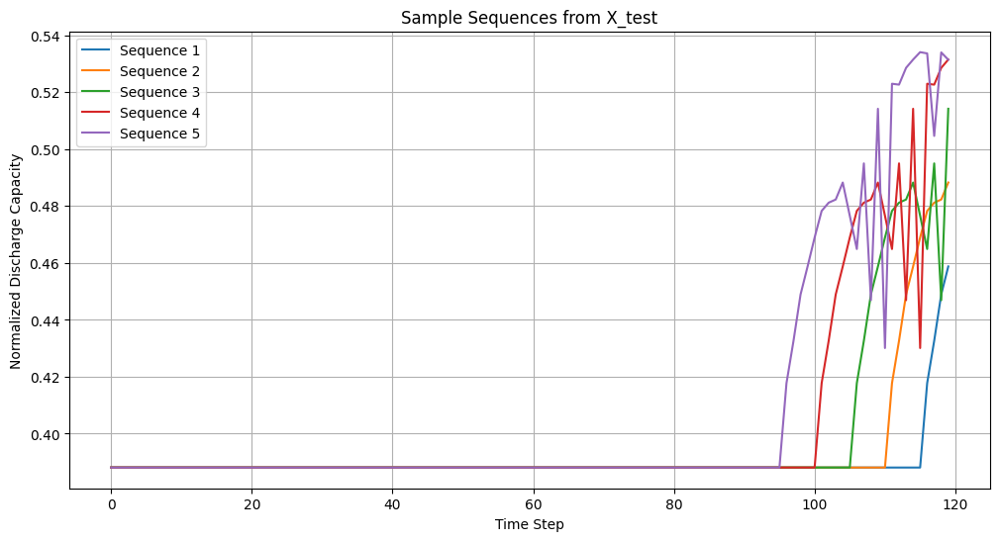

In [ ]:
import matplotlib.pyplot as plt

# Limit to first 5 sequences for clarity
num_sequences = min(5, len(X_test))

plt.figure(figsize=(12, 6))
for i in range(num_sequences):  
    plt.plot(X_test[i].flatten(), label=f'Sequence {i+1}')

plt.title('Sample Sequences from X_test')
plt.xlabel('Time Step')
plt.ylabel('Normalized Discharge Capacity')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
print("X_train shape:", X_train.shape)  # Should be (N, 120, 1) for LSTM input
print("X_val shape:", X_val.shape)  # Should be (N, 120, 1) for LSTM input
print("X_test shape:", X_test.shape)  # Should be (N, 120, 1) for LSTM input


X_train shape: (15853, 120, 1)
X_val shape: (3171, 120, 1)
X_test shape: (4053, 120, 1)


X_test shape: (4053, 120)


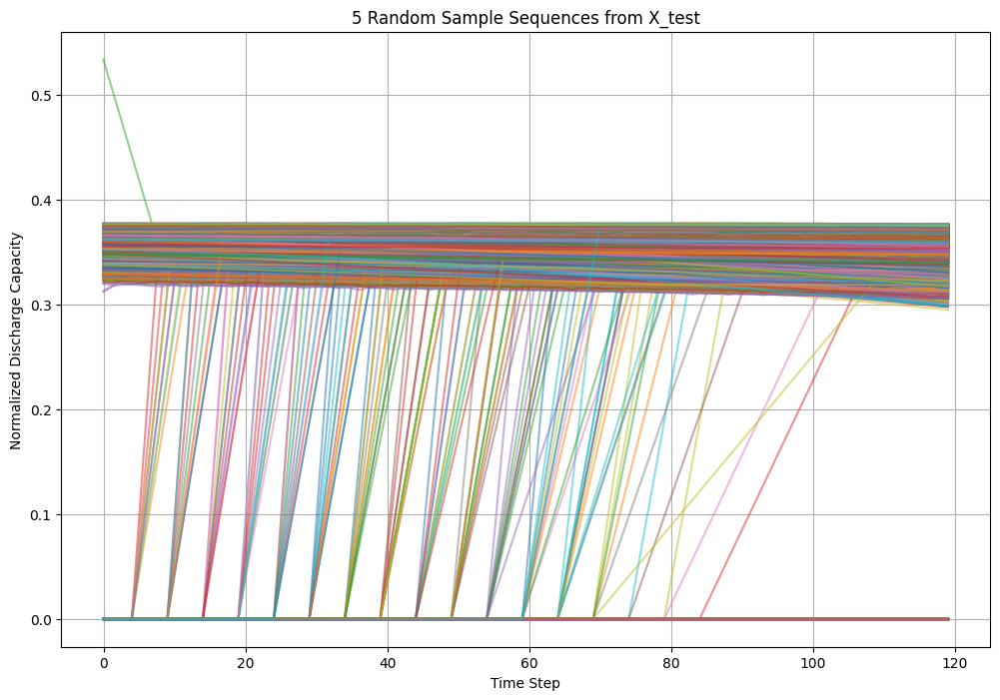

In [78]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from lime.lime_tabular import LimeTabularExplainer
import time

# Step 1: Reshape X_train and X_test for LIME (2D representation)
X_train_2d = X_train.reshape(X_train.shape[0], -1)  # Shape (n_train, 120)
X_test_2d = X_test.reshape(X_test.shape[0], -1)     # Shape (n_test, 120)

# Step 2: Create feature names for each timestep
feature_names = [f"timestep_{i}" for i in range(X_train.shape[1])]

# Step 3: Initialize the LIME explainer for regression
explainer_lime = LimeTabularExplainer(
    training_data=X_train_2d,
    feature_names=feature_names,
    mode='regression',
    discretize_continuous=False  # Set to False since this is time series data
)

# Step 4: Define a wrapper function for LIME predictions
def predict_wrapper_lstm(X_input):
    """
    Wrapper function for LIME to predict using the LSTM model.
    The function takes 2D input and reshapes it back to 3D before making predictions.
    """
    X_input_3d = X_input.reshape(X_input.shape[0], X_train.shape[1], 1)  # Reshape back to (n_samples, 120, 1)
    y_pred_log = model.predict(X_input_3d).flatten()


    
    # Transform back to original scale (Choose based on your preprocessing)
    if use_minmax_scaling:
        y_pred_original = scaler_y.inverse_transform(y_pred_log.reshape(-1, 1)).ravel()
    else:
        y_pred_original = np.expm1(y_pred_log)  # Inverse of log1p

    return y_pred_original

# Step 5: Select 10 random instances and explain using LIME
random_indices = np.random.choice(range(len(X_test_2d)), 10, replace=False)

for index in random_indices:
    # Step 6: Select a test instance and explain using LIME
    instance = X_test_2d[index]  # A 1D vector of shape (120,)
    explanation = explainer_lime.explain_instance(instance, predict_wrapper_lstm, num_features=120)

    # Step 7: Convert LIME explanation to a DataFrame
    lime_explanation_list = explanation.as_list()  # e.g., [("timestep_0", 0.12), ("timestep_1", -0.05), ...]
    df_lime = pd.DataFrame(lime_explanation_list, columns=["feature", "contribution"])
    df_lime["timestep_index"] = df_lime["feature"].str.extract("timestep_(\d+)").astype(int)

    # Step 8: Create a Plotly bar plot for LIME feature importance
    fig = go.Figure(data=go.Bar(
        x=df_lime["timestep_index"],
        y=df_lime["contribution"],
        marker_color="teal"
    ))
    fig.update_layout(
        title=f"LIME Explanation by Timestep (Instance {index})",
        xaxis_title="Timestep Index",
        yaxis_title="Contribution",
        xaxis=dict(tickmode="linear", dtick=10)  # Show ticks every 10 timesteps
    )

    # Step 9: Display the plot
    fig.show()

    # Step 10: Add delay to avoid overload
    time.sleep(1)


/var/folders/nn/4_r89tj92wd44cypgj5z6vkh0000gn/T/ipykernel_29435/3623673472.py:23: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Train shape: (15853, 120, 1), (15853,)
Test shape: (4053, 120, 1), (4053,)
Max RUL in Training Data (Original Scale): 2230.00
Max RUL in Test Data (Original Scale): 1845.00
Max RUL in Training Data (Scaled): 1.00
Max RUL in Test Data (Scaled): 0.83
